# Midterm Exam (part 2) - Computational Physics I

### Deadline: Monday 14 April 2024 (by 19h00)
### Name: Milagros Delgado 

## Part 2. Two-Body Problem: Black Hole Orbits

### Module Design:

(a) Read the instructions and clearly outline the directory structure of your module. Follow the class notes on how to structure python packages.

```
orbit-simulation-toolkit
├── orbits/
│   ├── __init__.py
│   └── orbits.py
└── tests/
    ├── tests-orbits.py
    └── TBA
├── analysis.ipynb
├── LICENSE
├── pyproject.toml
├── README.md
└── outputfolder/
    ├── animations/
    ├── grids/
    └── orbits_data/
```

### Relativistic versus classical mechanics:

(i) Use your module/script to run and show two simulations: one relativistic and one classical for this set of initial conditions. It may be helpful to compare the orbital history in a single plot.

| Parameter | Description                                       | Units      |
|-----------|---------------------------------------------------|------------|
| $e$       | Eccentricity of the orbit                         | $0$        |
| $M$       | Mass of the central black hole                    | $5\times 10^6\,\rm M_\odot$ |
| $a$       | Semi-major axis of the orbit                      | $1\,\rm AU$|
| $N$       | Number of orbital periods to simulate             | $2$        |
| Method    | Numerical method for ODE integration              | RK3        |

In [3]:
# Importing libraries
from orbits import TwoBodyProblem, SimulationRunner, AnalysisTools, AnimationCreator
from IPython import display

In [4]:
# Defining parameters from the table 
e = 0 # [-]
M = 5.e6 # [solar masses]
a = 1. # [AU]
N = 2. # [-]
method = 'RK3'

In [5]:
# Running the classical simulation
system_class = TwoBodyProblem(e, M, a, N, method, relativity = False)
runner = SimulationRunner(system_class)
t_class, s_class = runner.run_simulation()

# Running the relativistic simulation
system_relat = TwoBodyProblem(e, M, a, N, method, relativity = True)
runner_relat = SimulationRunner(system_relat)
t_relat, s_relat = runner_relat.run_simulation()

In [4]:
# Creating the animation
animator = AnimationCreator(system_relat)
animator.animate_rel_vs_class(t_class, s_class, t_relat, s_relat, save_gif = True)

Gif saved to outputfolder/animations/animation_relat_class_comp_e0_mass_bh5.0e+06_sm_axis1.0_orb_period2.0_RK3.gif


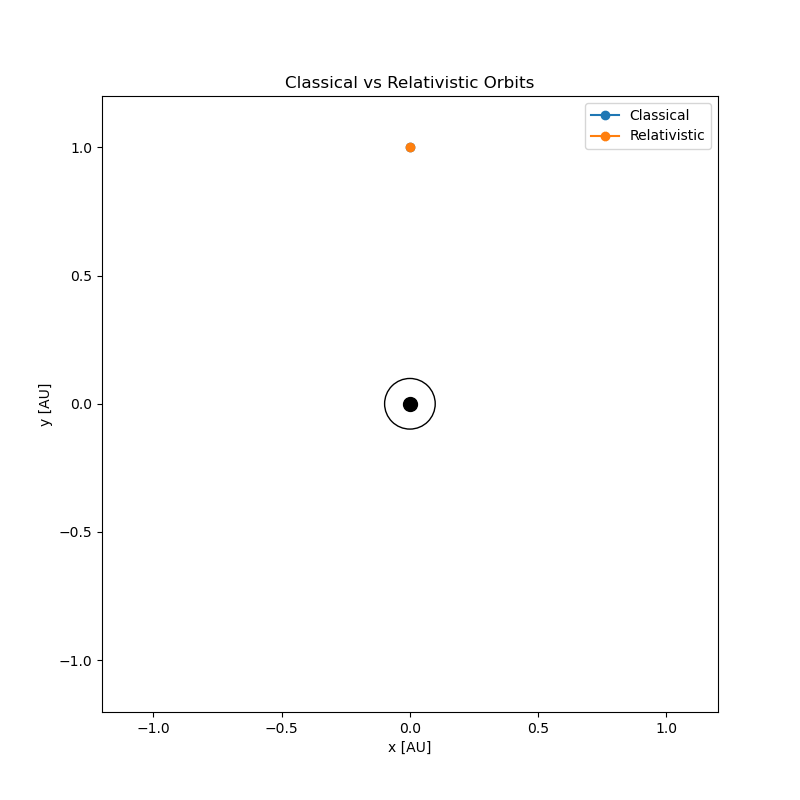

In [5]:
# Displaying the animation
display.Image(open('./outputfolder/animations/animation_relat_class_comp_e0_mass_bh5.0e+06_sm_axis1.0_orb_period2.0_RK3.gif', 'rb').read())

(j) Use the orbital history of both simulations to design a method that quantifies their differences and evaluates the importance of using the relativistic approach for massive objects. Do we need to worry about the relativistic corrections if we replace the black hole with our Sun?

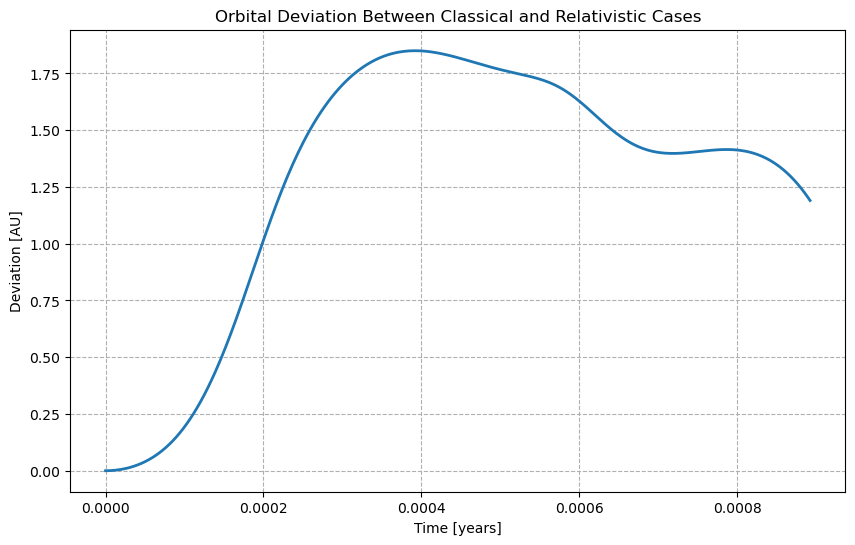

In [6]:
# Calling the AnalysisTools class to compare the results
analysis = AnalysisTools()
analysis.compare_rel_vs_class(t_class, s_class, t_relat, s_relat)

The plot shows increasing orbital deviation over time, peaking at over 1.75 AU after one complete orbit. This demonstrates that relativistic effects become significant for massive objects like black holes. However, for less massive bodies like our Sun (which weighs substantially less than the black hole in this simulation), these relativistic corrections can safely be neglected in most orbital calculations.

### The role of eccentricity:


(k) Use your module/script to run and show three relativistic simulations for objects with different eccentricities, $e$, and assuming the same $M$, $a$, $N$ as above. It may be helpful to compare the orbital history for all values of $e$ in a single plot throughout time.

| Object           | Eccentricity ($e$) | Integration Method |
|------------------|--------------------|--------------------|
| Earth            | 0.01671            | Trapezoidal        |
| Pluto            | 0.25               | Trapezoidal        |
| 7092 Cadmus      | 0.70               | Trapezoidal        |

In [6]:
# Defining the parameters from the table
eccs = [('Earth', 0.01671), ('Pluto', 0.25), ('7092 Cadmus', 0.70)]

results = []

for name, ecc in eccs:
    system = TwoBodyProblem(ecc, M, a, N, method = 'Trapezoidal', relativity = True)
    runner = SimulationRunner(system)
    t, s = runner.run_simulation()
    results.append((t, s, f'{name} (e = {ecc})'))

In [8]:
# Creating the animation for different eccentricities
animator = AnimationCreator(system)
animator.animate_eccentricities(results, save_gif = True)

Gif saved to outputfolder/animations/animation_eccs_comp_mass_bh5.0e+06_sm_axis1.0_orb_period2.0_relat_Trapezoidal.gif


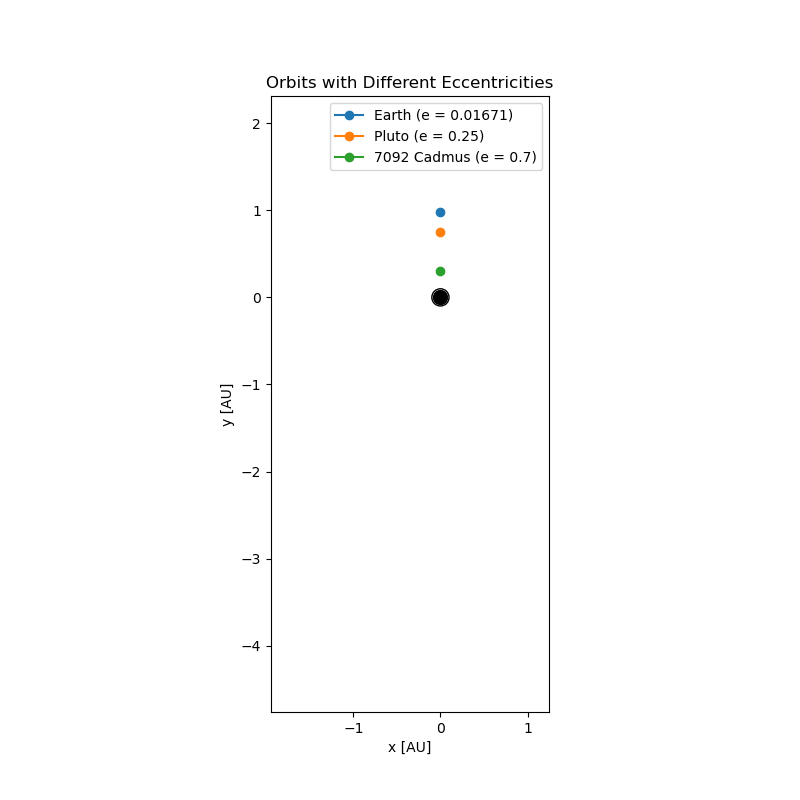

In [9]:
# Displaying the animation
display.Image(open('./outputfolder/animations/animation_eccs_comp_mass_bh5.0e+06_sm_axis1.0_orb_period2.0_relat_Trapezoidal.gif', 'rb').read())

(l) Describe the differences in the orbits of the above objects. What happens to objects with high eccentricities?

The orbits show clear differences - Earth and Pluto follow nearly circular paths because their orbits aren't very stretched out (given by their eccentricities low value). But asteroid 7092 Cadmus has a much more oval-shaped orbit that brings it very close to the black hole at one end and far away at the other. When it's close, it moves extremely fast, then slows down when far away. The simulation shows it eventually flying out of orbit, which might happen because of the accumulation of errors from the used numerical methods.

### Numerical convergence (3 points):

(m) Use your script to generate additional simulations with the same initial conditions as before, but only for $e=0.01671$ (Earth's eccentricity) with RK3, the Trapezoidal method and the higher-order SciPy integrator. Compare the orbital history for all methods in a single plot throughout time.


In [7]:
# Defining parameters
e = 0.01671 # [-]
methods = [('Trapezoidal', 'Trapezoidal'), ('RK3', 'RK3'), ('Scipy', 'Scipy')]

results = []

for label, method in methods:
    system = TwoBodyProblem(e, M, a, N, method = method, relativity = True)
    runner = SimulationRunner(system)
    t, s = runner.run_simulation()
    results.append((t, s, label))

In [8]:
# Creating the animation for different methods
animator = AnimationCreator(system)
animator.animate_methods(results, save_gif = True)

Gif saved to outputfolder/animations/animation_methods_comp_e0.01671_mass_bh5.0e+06_sm-axis1.0_orb_period2.0_relat.gif


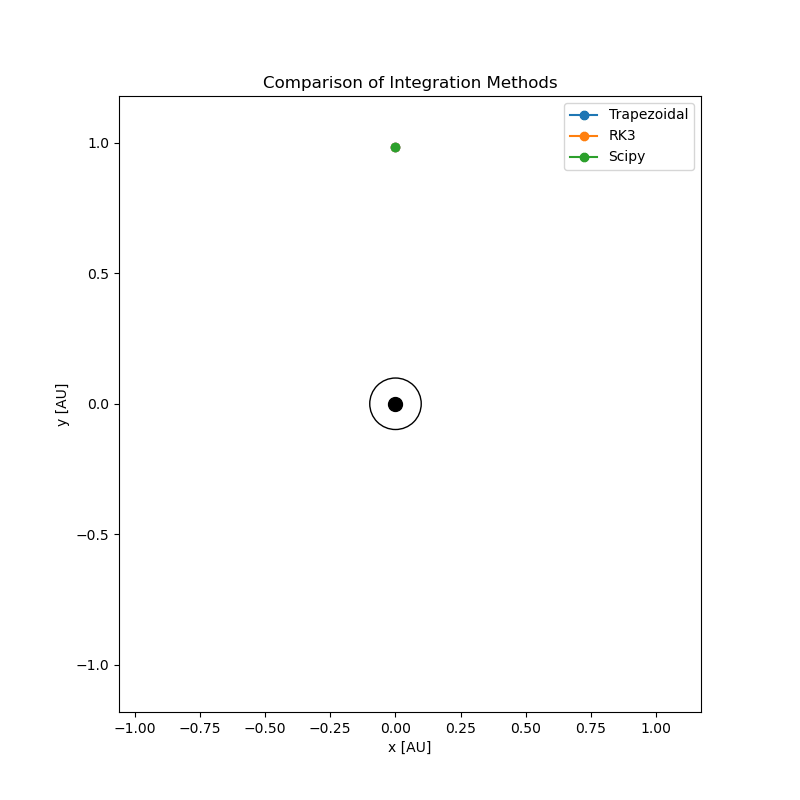

In [9]:
# Displaying the animation
display.Image(open('./outputfolder/animations/animation_methods_comp_e0.01671_mass_bh5.0e+06_sm-axis1.0_orb_period2.0_relat.gif', 'rb').read())

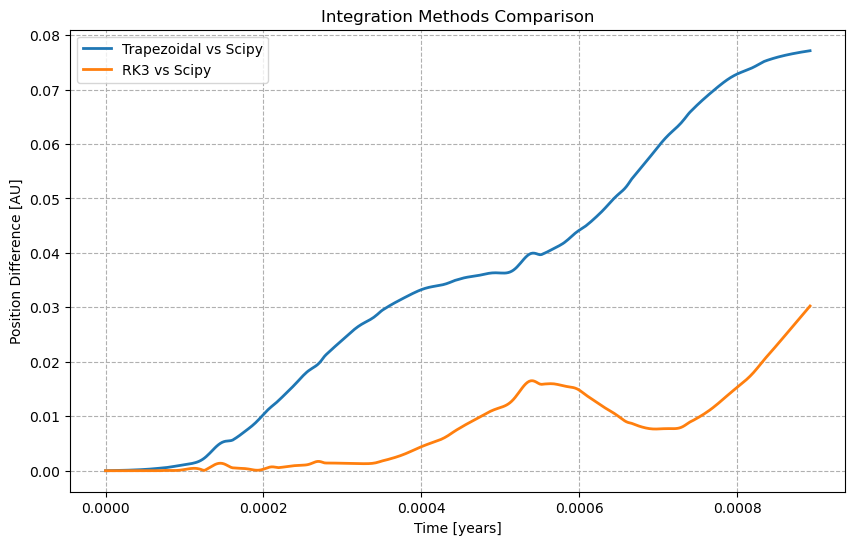

In [10]:
# Comaprison plot
analysis = AnalysisTools()
analysis.compare_methods(results)

(n) Measure convergence of the simulations with RK3 and Trapezoidal method for $e=0.01671$ by integrating at a number of different time steps. To analyse convergence, you need to define some measure for the error with respect to the higher order method, and then plot it against different time steps for both methods. Thus, you may add additional functions for this to your code in **orbits.py**. 

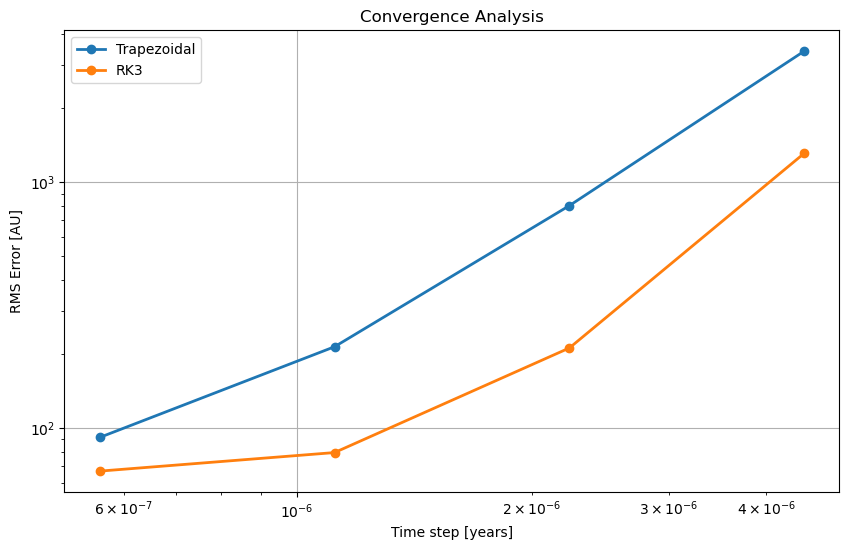

In [11]:
# Using Scipy as reference solution
system_ref = TwoBodyProblem(e, M, a, N, 'Scipy', relativity = True)
runner = SimulationRunner(system_ref)
t_ref, s_ref = runner.run_simulation()

# Defining the methods and time steps
methods = ['Trapezoidal', 'RK3']
dts = [system_ref.period/100, system_ref.period/200, 
       system_ref.period/400, system_ref.period/800]

# Preparing the solution for each method
sols_dict = {}
for method in methods:
    sols = []
    for dt in dts:
        system = TwoBodyProblem(e, M, a, N, method, relativity = True)
        system.dt = dt
        runner = SimulationRunner(system)
        t, s = runner.run_simulation()
        sols.append((t, s))
    sols_dict[method] = sols

# Calling the convergence_analysis method
analysis = AnalysisTools()
errors = analysis.convergence_analysis((t_ref, s_ref), sols_dict, dts)